## INDIVIDUAL FINAL REPORT (DRAFT)

Quang Tuan (Finn) Pham

November 27th, 2023

STAT 301 - 101

Professor Gabriel Cohen Freue 

### __INTRODUCTION__:
When studying a income generated of a movie, we are interested in understanding factors that affect the movie's income. In a research study titled: __Determinants of Box Office Performance: Return of the Regressions__ at the University of Northern Iowa, Scott (2019) argued that audience reviews are critical in the success of a movie. They indicate the quality of a movie and affect its visibility (Scott, 2019). Further, he shares that review websites such as Rotten Tomatoes help him decide whether a ticket is worth buying. In this project, combining with discussions with the teaching team, I will be discussing how __movie's income is influenced by its year of release, certification rating, number of votes received and its ratings.__

### __EXPLORATORY DATA ANALYSIS (ADAPTED AND IMPROVED FROM EDA ASSIGNMENT):__
The dataset (which was last updated on October 3rd, 2023) we will be using contains statistics on 10,000 movies and its characteristics and performance. Data can be accessed via: https://www.kaggle.com/datasets/dk123891/10000-movies-data/data

For this analysis, our variables of interests are: `Movie_Rating`, `Gross`, `Votes` and `Certification`

First, I will be importing essential libraries for the analysis:

In [37]:
#Loading Libraries:
library(tidyverse)
library(broom)
library(repr)
library(cowplot)
library(GGally)
library(stringr)
library(dplyr)
library(ggplot2)
library(scales)
library(RColorBrewer)


In [2]:
# Loading dataset:
movies = read_delim("https://raw.githubusercontent.com/tuanqpham/test/main/data.csv")
head(movies,3)

New names:
• `` -> `...1`
Rows: 10000 Columns: 13
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (6): Movie Name, Genre, Certification, Director, Stars, Description
dbl (7): ...1, Year of Release, Run Time in minutes, Movie Rating, Votes, Me...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


...1,Movie Name,Year of Release,Run Time in minutes,Movie Rating,Votes,MetaScore,Gross,Genre,Certification,Director,Stars,Description
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
0,The Shawshank Redemption,1994,142,9.3,2804443,82,28340000,['Drama'],R,['Frank Darabont'],"['Tim Robbins', 'Morgan Freeman', 'Bob Gunton', 'William Sadler']","['Over', 'the', 'course', 'of', 'several', 'years,', 'two', 'convicts', 'form', 'a', 'friendship,', 'seeking', 'consolation', 'and,', 'eventually,', 'redemption', 'through', 'basic', 'compassion.']"
1,The Godfather,1972,175,9.2,1954174,100,134970000,"['Crime', ' Drama']",R,['Francis Ford Coppola'],"['Marlon Brando', 'Al Pacino', 'James Caan', 'Diane Keaton']","['Don', 'Vito', 'Corleone,', 'head', 'of', 'a', 'mafia', 'family,', 'decides', 'to', 'hand', 'over', 'his', 'empire', 'to', 'his', 'youngest', 'son', 'Michael.', 'However,', 'his', 'decision', 'unintentionally', 'puts', 'the', 'lives', 'of', 'his', 'loved', 'ones', 'in', 'grave', 'danger.']"
2,Ramayana: The Legend of Prince Rama,1993,135,9.2,12995,NA,NA,"['Animation', ' Action', ' Adventure']",PG,"['Ram Mohan', 'Yûgô Sakô', 'Koichi Saski']","['Arun Govil', 'Nikhil Kapoor', 'Edie Mirman', 'Rael Padamsee']","['An', 'anime', 'adaptation', 'of', 'the', 'Hindu', 'epic', 'the', 'Ramayana,', 'where', 'Lord', 'Ram', 'combats', 'the', 'wicked', 'king', 'Ravana.']"


#### OVERALL DATA STRUCTURE:
* First, we will try understand the general structure of our dataset through the number of rows, columns and its specific variables.

In [3]:
str(movies)

spc_tbl_ [10,000 × 13] (S3: spec_tbl_df/tbl_df/tbl/data.frame)
 $ ...1               : num [1:10000] 0 1 2 3 4 5 6 7 8 9 ...
 $ Movie Name         : chr [1:10000] "The Shawshank Redemption" "The Godfather" "Ramayana: The Legend of Prince Rama" "The Chaos Class" ...
 $ Year of Release    : num [1:10000] 1994 1972 1993 1975 2008 ...
 $ Run Time in minutes: num [1:10000] 142 175 135 87 152 195 201 96 202 147 ...
 $ Movie Rating       : num [1:10000] 9.3 9.2 9.2 9.2 9 9 9 9 9 9 ...
 $ Votes              : num [1:10000] 2804443 1954174 12995 42231 2786129 ...
 $ MetaScore          : num [1:10000] 82 100 NA NA 84 95 94 97 90 NA ...
 $ Gross              : num [1:10000] 2.83e+07 1.35e+08 NA NA 5.35e+08 ...
 $ Genre              : chr [1:10000] "['Drama']" "['Crime', ' Drama']" "['Animation', ' Action', ' Adventure']" "['Comedy', ' Drama']" ...
 $ Certification      : chr [1:10000] "R" "R" "PG" NA ...
 $ Director           : chr [1:10000] "['Frank Darabont']" "['Francis Ford Coppola']" "['Ram 

- Based on the output above, there are 10,000 rows each representing observations on a movie. There are a total of 13 columns in this dataset (including the Index column). Below are column names and explanations:

    * `Movie Name` (character variable):  Name of the movie
    * `Year Of Release`(continuous variable): The year when the movie was published.
    * `Movie Rating`(continuous variable): General rating of the movie.
    * `Votes`(continuous variable): number of votes this movie receives from the audience.
    * `MetaScore`(continuous variable): Meta Critic score of the movie.
    * `Gross`(continuous variable): Gross income of the movie.
    * `Genre`(categorical variable): Movie genre
    * `Certification` (categorical variable): General label rating of the movie.
    * `Director`(character variable): Director (or groups of director) of the movie.
    * `Stars`(character variable): Starring actors of the movies.
    * `Description`(character variabe): Descrbing overall theme of the movie.

- In the following scripts, we will be cleaning the data by selecting our variables of interests only, removing any missing values and reformatting variable names and observations to avoid potential errors in future procedures:

In [4]:
# Renaming variables:
names(movies) <- gsub(" ", "_", names(movies))
movies_new <- movies %>% rename(Index = ...1)
head(movies_new, 3)

Index,Movie_Name,Year_of_Release,Run_Time_in_minutes,Movie_Rating,Votes,MetaScore,Gross,Genre,Certification,Director,Stars,Description
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
0,The Shawshank Redemption,1994,142,9.3,2804443,82,28340000,['Drama'],R,['Frank Darabont'],"['Tim Robbins', 'Morgan Freeman', 'Bob Gunton', 'William Sadler']","['Over', 'the', 'course', 'of', 'several', 'years,', 'two', 'convicts', 'form', 'a', 'friendship,', 'seeking', 'consolation', 'and,', 'eventually,', 'redemption', 'through', 'basic', 'compassion.']"
1,The Godfather,1972,175,9.2,1954174,100,134970000,"['Crime', ' Drama']",R,['Francis Ford Coppola'],"['Marlon Brando', 'Al Pacino', 'James Caan', 'Diane Keaton']","['Don', 'Vito', 'Corleone,', 'head', 'of', 'a', 'mafia', 'family,', 'decides', 'to', 'hand', 'over', 'his', 'empire', 'to', 'his', 'youngest', 'son', 'Michael.', 'However,', 'his', 'decision', 'unintentionally', 'puts', 'the', 'lives', 'of', 'his', 'loved', 'ones', 'in', 'grave', 'danger.']"
2,Ramayana: The Legend of Prince Rama,1993,135,9.2,12995,NA,NA,"['Animation', ' Action', ' Adventure']",PG,"['Ram Mohan', 'Yûgô Sakô', 'Koichi Saski']","['Arun Govil', 'Nikhil Kapoor', 'Edie Mirman', 'Rael Padamsee']","['An', 'anime', 'adaptation', 'of', 'the', 'Hindu', 'epic', 'the', 'Ramayana,', 'where', 'Lord', 'Ram', 'combats', 'the', 'wicked', 'king', 'Ravana.']"


#### PRELIMINARY ANALYSIS:

In [5]:
#Selecting variables of interests:
movies <- movies_new %>% select(Movie_Rating, Votes, Gross, Certification, Year_of_Release)


#Calculating number of observations with missing values:
sum(is.na(movies$Gross))

#Dropping missing values:
movies_no_na <- movies %>%
drop_na()
head(movies_no_na, 3)

[1] 2915

Movie_Rating,Votes,Gross,Certification,Year_of_Release
<dbl>,<dbl>,<dbl>,<chr>,<dbl>
9.3,2804443,28340000,R,1994
9.2,1954174,134970000,R,1972
9.0,2786129,534860000,PG-13,2008


__Overall, there are a total of 2915 rows with missing values in gross income. As a result, I have decided to omit all such observations to avoid errors in future analysis.__

In the following code cell, I will be exploring `Certification` - a categorical variable by finding all of the distinct classes available and its frequency in the dataset:

In [6]:
#Certification variable:
movies_cert_count <- movies_no_na %>%
group_by(Certification)%>%
count()%>%
arrange(desc(n))

unique(movies_no_na$Certification)
head(movies_cert_count, 3)
tail(movies_cert_count, 3)

[1] "R"         "PG-13"     "Approved"  "PG"        "Not Rated" "G"        
 [7] "18+"       "Passed"    "16+"       "M/PG"      "GP"        "TV-MA"    
[13] "TV-PG"     "Unrated"   "TV-14"     "M"         "NC-17"     "13+"      
[19] "X"

Certification,n
<chr>,<int>
R,3193
PG-13,1888
PG,1018


Certification,n
<chr>,<int>
X,2
13+,1
18+,1


* __Overall, there are 19 different certification categories with movies with rating R (Restricted - children under 17 must have parental guidance) has the highest frequencies. On the other hand, a number of rating certifications only appeared once or twice in the dataset.__

* According the Motion Picture Association (MPA), the following movie rating certifications has been in use ever since 1996: `G`, `PG`, `PG-13`, `R` and `NC-17`. Therefore, I believe that it is only relevant to include such ratings into our analysis:

In [7]:
movies_cert_filtered <- movies_no_na %>%
filter(Certification %in% c("G", "PG", "PG-13", "R", "NC-17"))

In [8]:
movies_cert_count_filtered <- movies_cert_filtered %>%
filter(Certification %in% c("G", "PG", "PG-13", "R", "NC-17"))%>%
group_by(Certification)%>%
count()%>%
arrange(desc(n))

movies_cert_count_filtered

Certification,n
<chr>,<int>
R,3193
PG-13,1888
PG,1018
G,193
NC-17,20


Next, we would like to explore the distribution of our variables being studied. For numercial variables such as `Movie_Rating`, `Votes` and `Gross`, I will obtaining their descriptive statistics.

In [9]:
# Calculating descriptive statistics of numeric variables in the our dataset:
movies_num_summary <- do.call(cbind, lapply(movies_cert_filtered%>%select(Movie_Rating, Votes, Gross, Year_of_Release),
                     summary))

round(movies_num_summary, 2)

,Movie_Rating,Votes,Gross,Year_of_Release
Min.,4.90,10002.0,0,1927.00
1st Qu.,6.10,23426.5,4400000,1994.00
Median,6.60,55591.5,21300000,2004.00
Mean,6.64,126710.1,44555657,2001.97
3rd Qu.,7.20,137856.0,54557500,2012.00
Max.,9.30,2804443.0,936660000,2022.00


#### DATA VISUALIZATION:
- For this section, I will be assessing the relationships between our variables of interests by producing a pair-wise plots of variables.

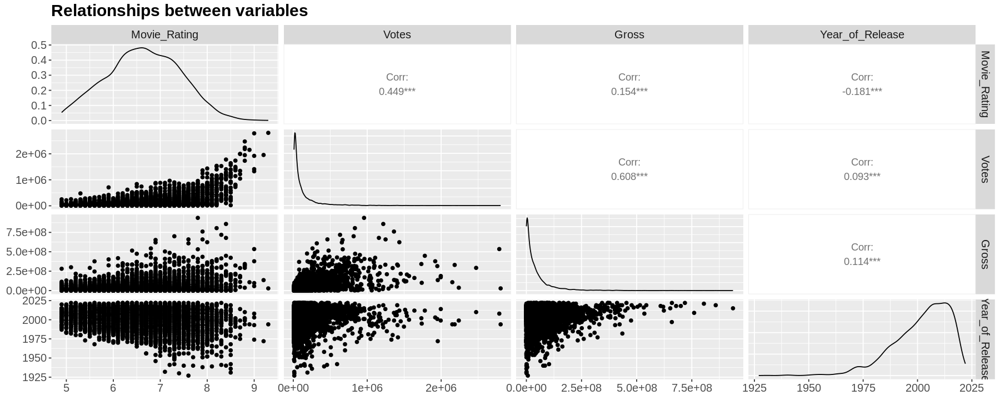

In [10]:
options(repr.plot.width = 15, repr.plot.height = 6) 

movies_dist <- movies_cert_filtered %>%
select(Movie_Rating, Votes, Gross, Year_of_Release)%>%
 ggpairs(progress = FALSE) +
  theme(
    text = element_text(size = 15),
    plot.title = element_text(face = "bold"),
    axis.title = element_text(face = "bold")
  )+
ggtitle("Relationships between variables")

movies_dist

- __Some observations on our pair plots indicated above:__
    * Both the line plots demonstrating the distribution of Movies Gross Income and Number of Votes are both __right-skewed__.
    * The correlation between Gross Income and Votes are fairly high. __This indivcates a potential issue of multicollinearity.__
    * The relationship between `Year_of_Release` and `Gross` appears to be exponential.

Next, I want to have a closer look in the relationship between the numerical variables. In the following script, I will be creating a scatterplot demonstrating the __relationship between the movies' number of votes and its gross income__. Additionally, I will also include a color pallete in the points, representing their critic rating score:

`geom_smooth()` using formula = 'y ~ x'


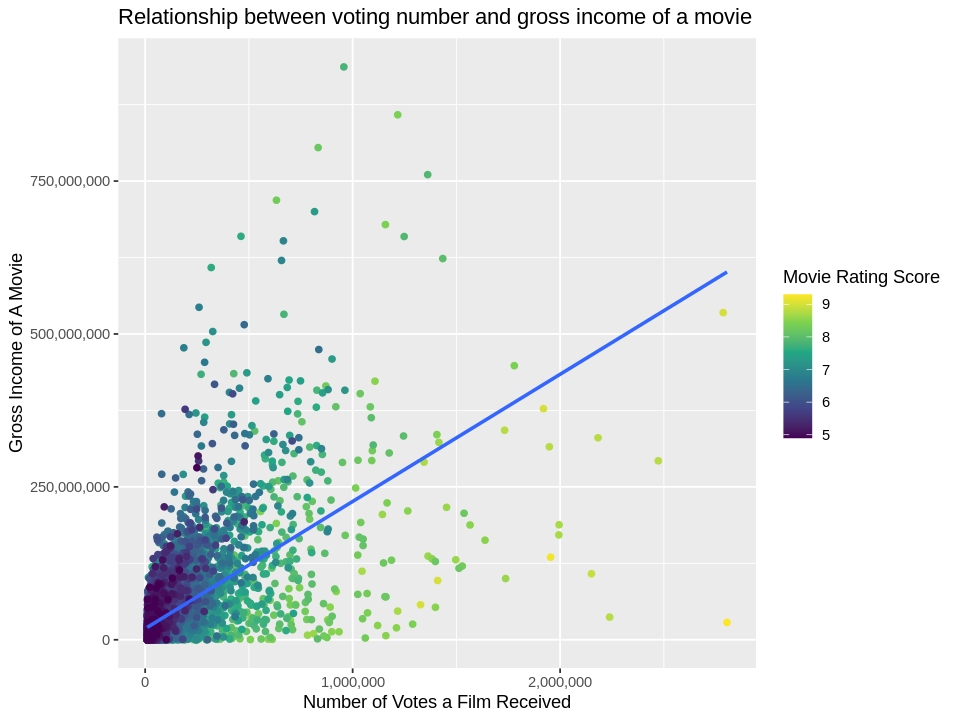

In [11]:
options(repr.plot.width = 8, repr.plot.height = 6) 

movies_plot <- movies_cert_filtered %>%
ggplot(aes(x = Votes, y = Gross))+
ggtitle("Relationship between voting number and gross income of a movie")+
geom_point(aes(color = Movie_Rating), alpha = 1)+ 
scale_color_continuous(type = "viridis")+
scale_x_continuous(labels = label_comma())+
scale_y_continuous(labels = label_comma())+
geom_smooth(method = "lm", se = FALSE)+
xlab("Number of Votes a Film Received")+
ylab("Gross Income of A Movie")+
labs(color = "Movie Rating Score")


movies_plot

- __Some observations acquired from the above visualization__:
    * Given our main goal in this visualization is to study the relationship between two continuous variables, it is best to use a scatterplot to understand such association.
    * Movies with higher rating scores (points with brighter color as specified in the pallete) receives more votes and produce higher income.
    * The line fitted using `geom_smooth` is upward-sloping, indicating that there is a positive association between Number of Votes of a Movie and Its Income.

### __METHODS AND PLANS__:

* __Note:__ After attending my group interview with the course instructors, I have decided to expand my study on factors influencing on the gross income of the movie by including the variable `Year_of_Release` as an exploratory into my model. 

* __Proposed Method__:
    - For this project, I will be implementing a __multiple regression model__ to gain an understanding of how reviews and facts about a movie (such as Year of Release or Ceritification label) has a relationship with its gross income.
    - In this multiple regression model, `Gross` will be the response variable and the following are potential explanatory variables: `Movie_Rating`, `Votes`, `Certification`, `Year_of_Release`. In general, our model has the following form:
    \begin{equation}
    Gross = \beta_{0} + \beta_{1}*\text{Year Of Release} + \beta_{2}*\text{Certification} + \beta_{3}*\text{Votes} + \beta_{4}*\text{Movie Rating Score} + \epsilon
    \end{equation}
    - Given our main aim of the study is to understand how movie income is related to its characteristics, I believe that using multiple regression to assess such relationship is appropriate. However, there are a number of __assumptions__ needed:
        * There needs to be a __linear relationship__ between the dependent variable with each of the exploratory variable. Given the pairplots shown above, we know that `Gross` and `Year_of_Release` are exponentially related to each other. Hence, a log-transformation on `Gross` may be essential to meet the assumption
        * __No multicollinearity__: The independent variables must not be highly correlated with each other. Before finalizing our model, I will be checking the severity of collinearity by computing the Variance Inflation Factor using `vif()` of each independent variable.
        * __Equal variance of the error terms (homoskedasticity):__ This can be checked by looking at the fitted-residual value plot.
        * __Conditional distribution of error terms are normal__:

    - Since our question of interest is an inferential question, a training-testing data split may not be necessary.
* __Potential weaknesses of the method__:
    - This type of regression may be sensitive to outliers. To deal with such problems, we may need to remove several observations that appears to be outliers to ensure accuracy.


### __IMPLEMENTATIONS OF PROPOSED METHOD__:

#### Model fitting:
- Using the function `lm()`, I have fitted a multiple regression model with `Gross` as the response variable and the remaining variables: `Votes`, `Certification`,`Year_of_Release` and `Movie_Rating` as the explanatory variables. Other formatting of values in the model has also been applied.

In [36]:
# Our model:
options(scipen = 999)

movies_model <- lm(Gross ~ Votes + Certification + Year_of_Release + Movie_Rating,
                   data = movies_cert_filtered)
tidy(movies_model, conf.int = TRUE)%>%mutate_if(is.numeric, round, 4)

term,estimate,std.error,statistic,p.value,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),-623518949.1485,111186123.270,-5.6079,0.0000,-841481594.9153,-405556303.3817
Votes,220.9872,3.673,60.1655,0.0000,213.7869,228.1875
CertificationNC-17,-52678386.8849,12214873.026,-4.3126,0.0000,-76623695.5624,-28733078.2073
CertificationPG,-4725818.4525,4150661.025,-1.1386,0.2549,-12862526.8119,3410889.9069
CertificationPG-13,-19551049.8258,4122098.547,-4.7430,0.0000,-27631766.0077,-11470333.6438
CertificationR,-47686648.3421,3997226.260,-11.9299,0.0000,-55522572.3381,-39850724.3461
Year_of_Release,369557.3800,55230.208,6.6912,0.0000,261287.3737,477827.3863
Movie_Rating,-10370614.1480,981349.211,-10.5677,0.0000,-12294392.6220,-8446835.6740


* __Important Observation__: 
    - The majority of the independent variables have p-values of 0 which shows that their relationship with the response variable `Gross` is significant.
    - Most coefficient estimates of the independent variables were as expected. For example, movies with restriction (NC-17, PG, PG-13 and R) have lower earnings compared to movies allowed to the general public. However, it was surprising to the estimated coefficient of `Movie_Rating` being negative. This implies that for an increase in 0.1 of a rating score is associated with a decrease of roughly 10.3 million dollars in movie income.
    - For the variable `Certification`, I noticed that the category `PG` has an insignificant effect while other levels of this categorical variable remained significant. We may need to run another model with the `Certification` variable then perform an ANOVA test to compare between the two models.

- After fitting the model, I will obtaining goodness-of-fit measures using the `glance` function. 

In [19]:
glance(movies_model)

r.squared,adj.r.squared,sigma,statistic,p.value,df,logLik,AIC,BIC,deviance,df.residual,nobs
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
0.4522463,0.451638,51928262,743.546,0,7,-121087.4,242192.8,242253.5,16999016051042652160,6304,6312


- The model has an R-squared value of 0.452. This means that about 45.2% of the varation in `Gross` is explained by the explanatory variables. 